In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca637.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca3400.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca783.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca3927.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca4109.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca95.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca488.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca2140.jp

In [2]:
!pip install torch torchvision pytorch-lightning timm


In [3]:
import os

# Caminho onde o Kaggle coloca os datasets importados
dataset_path = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets"

# Listando os arquivos
print("Arquivos no dataset:", os.listdir(dataset_path))

Arquivos no dataset: ['lung_aca', 'lung_scc', 'lung_n']


In [4]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
import os

# ===============================
# 1. Definições e transformações
# ===============================
dataset_path = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets" 

data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Tamanho padrão da ResNet
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalização do ImageNet
                         std=[0.229, 0.224, 0.225])
])

# ===============================
# 2. Carregamento do dataset
# ===============================
dataset = ImageFolder(root=dataset_path, transform=data_transforms)
print("Total de imagens:", len(dataset))
print("Classes encontradas:", dataset.classes)

# ===============================
# 3. Divisão: Treino, Validação e Teste
# ===============================
total_size = len(dataset)
train_size = int(0.7 * total_size)
val_size = int(0.15 * total_size)
test_size = total_size - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])
print(f"Tamanhos -> Treino: {len(train_dataset)}, Validação: {len(val_dataset)}, Teste: {len(test_dataset)}")

# ===============================
# 4. DataLoaders
# ===============================
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

Total de imagens: 15000
Classes encontradas: ['lung_aca', 'lung_n', 'lung_scc']
Tamanhos -> Treino: 10500, Validação: 2250, Teste: 2250


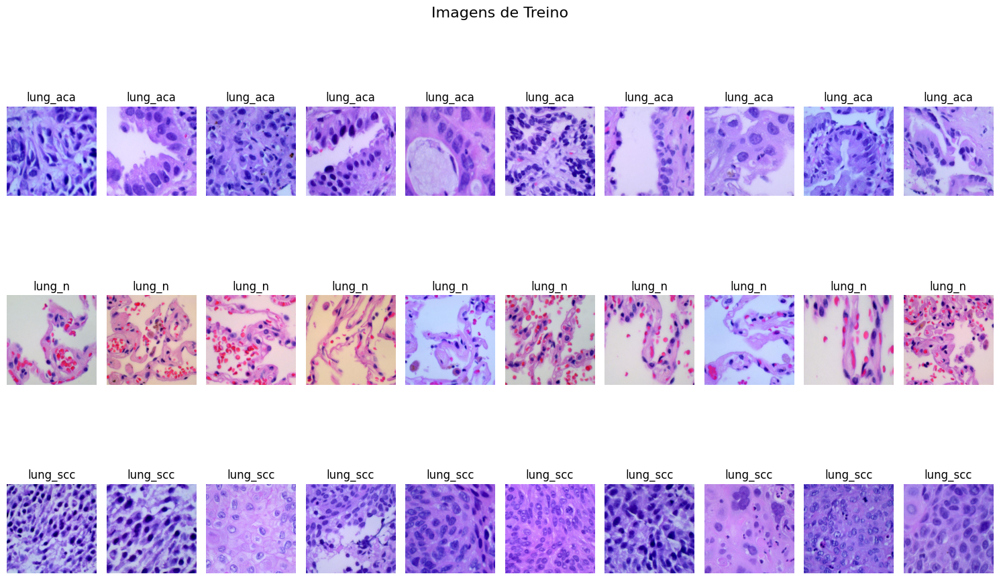

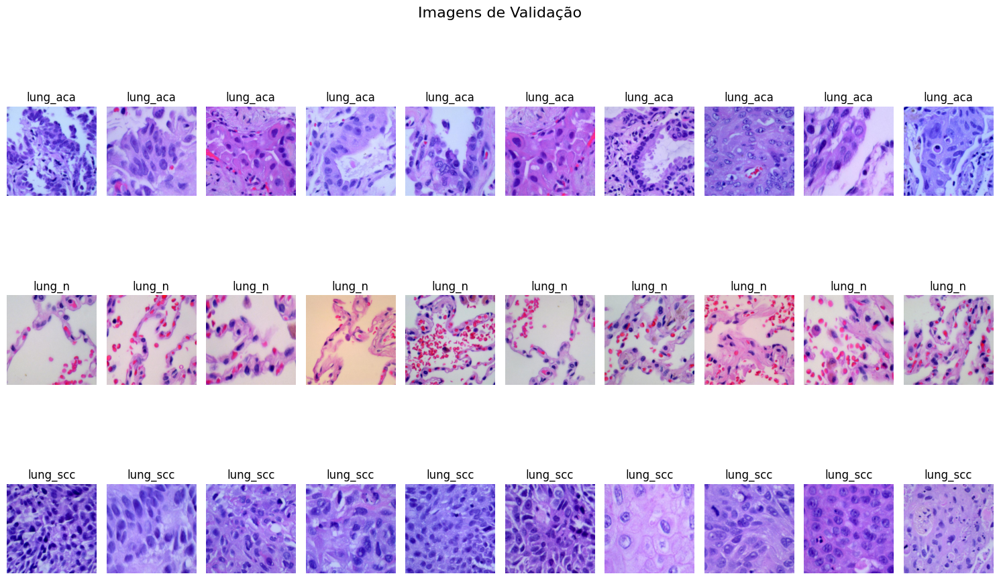

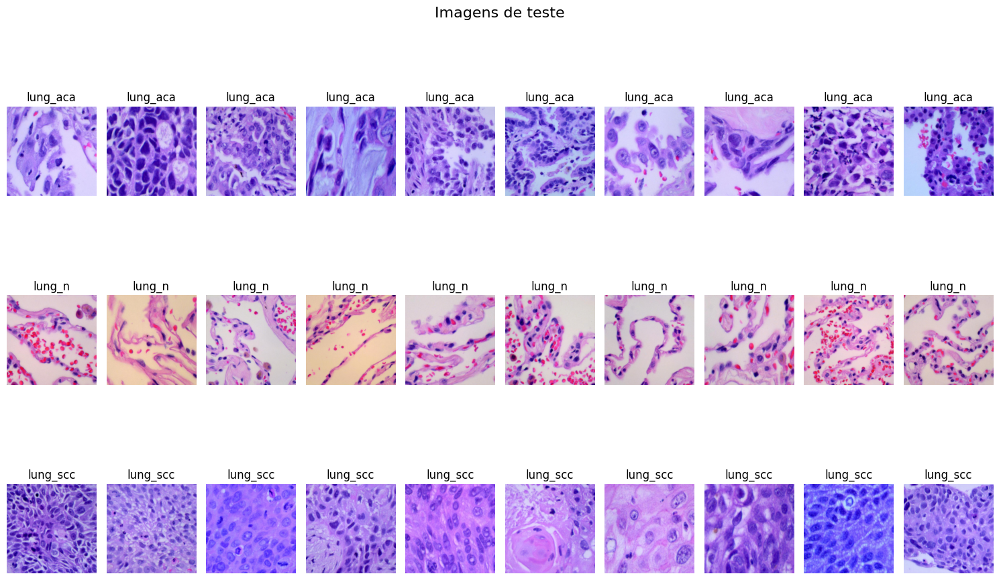

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# Função para desnormalizar as imagens (voltar aos valores originais)
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])  # Médias usadas na normalização
    std = np.array([0.229, 0.224, 0.225])   # Desvios padrão usados na normalização
    img = img.numpy().transpose((1, 2, 0))  # Reorganiza as dimensões do tensor para exibição
    img = img * std + mean  # Reverte a normalização
    img = np.clip(img, 0, 1)  # Garante que os valores fiquem entre 0 e 1
    return img

# Função para exibir imagens do DataLoader
def show_images(dataloader, title, num_images=10):
    class_counts = {class_name: 0 for class_name in dataset.classes}  # Contador de classes
    max_per_class = num_images  # Máximo de imagens por classe

    fig, axes = plt.subplots(len(dataset.classes), num_images, figsize=(15, 10))  # Cria a grade de imagens
    
    for images, labels in dataloader:
        for img, label in zip(images, labels):
            class_name = dataset.classes[label]  # Nome da classe
            if class_counts[class_name] < max_per_class:
                row = dataset.classes.index(class_name)  # Linha correspondente à classe
                col = class_counts[class_name]  # Próxima coluna disponível
                axes[row, col].imshow(denormalize(img))  # Exibe a imagem desnormalizada
                axes[row, col].axis("off")
                axes[row, col].set_title(class_name)
                class_counts[class_name] += 1
            
            # Para quando todas as classes atingirem 10 imagens
            if all(count >= max_per_class for count in class_counts.values()):
                break
        if all(count >= max_per_class for count in class_counts.values()):
            break

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Exibir imagens do conjunto de treino
show_images(train_loader, "Imagens de Treino", num_images=10)

# Exibir imagens do conjunto de validação
show_images(val_loader, "Imagens de Validação", num_images=10)
# Exibir imagens do conjunto de validação

show_images(test_loader, "Imagens de teste", num_images=10)


In [6]:
import pytorch_lightning as pl
import torch
import torchvision.models as models
import torch.nn as nn
from torchvision.models import resnet18, ResNet18_Weights

class CancerClassifier(pl.LightningModule):
    def __init__(self, num_classes=3):
        super(CancerClassifier, self).__init__()

        self.model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        in_features = self.model.fc.in_features
        self.model.fc = nn.Linear(in_features, num_classes)

        self.criterion = nn.CrossEntropyLoss()

        # # 🔹 Criar listas para armazenar as métricas
        # self.train_losses = []
        # self.val_losses = []
        # self.val_accuracies = []


    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        # 🔹 Salvar perda do treino
        #self.train_losses.append(loss.item())

        self.log("train_loss", loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = self.criterion(outputs, labels)

        preds = torch.argmax(outputs, dim=1)
        acc = (preds == labels).float().mean()

        # 🔹 Salvar métricas de validação
       # self.val_losses.append(loss.item())
       # self.val_accuracies.append(acc.item())

        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc", acc, prog_bar=True, on_epoch=True)
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-4)


# Função para gerar a Matrix Confusão

In [7]:
def plot_confusion_matrix_and_metrics(model, dataloader, class_names):
    from sklearn.metrics import (
        confusion_matrix, ConfusionMatrixDisplay,
        accuracy_score, recall_score, precision_score, f1_score, classification_report
    )
    import numpy as np
    import matplotlib.pyplot as plt
    import torch

    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Matriz de confusão
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Matriz de Confusão")
    plt.show()

    # Métricas para múltiplas classes (macro average: trata todas igualmente)
    acc = accuracy_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds, average='macro')
    precision = precision_score(all_labels, all_preds, average='macro')
    f1 = f1_score(all_labels, all_preds, average='macro')

    print("\nMétricas de Desempenho:")
    print(f"Acurácia: {acc:.4f}")
    print(f"Sensibilidade (Recall - média macro): {recall:.4f}")
    print(f"Precisão (Precision - média macro): {precision:.4f}")
    print(f"F1-score (média macro): {f1:.4f}")

    print("\nRelatório de Classificação:")
    print(classification_report(all_labels, all_preds, target_names=class_names))


In [8]:
import matplotlib.pyplot as plt

# def plot_training_results(model):
#     epochs = range(1, len(model.val_losses) + 1)

#     # Plotando Loss
#     plt.figure(figsize=(12, 5))
    
#     plt.subplot(1, 2, 1)
#     plt.plot(epochs, model.val_losses, label="Validation Loss", color="red") # marker="o")
#     plt.xlabel("Época")
#     plt.ylabel("Loss")
#     plt.title("Perda por época")
#     plt.legend()

#     # Plotando Acurácia
#     plt.subplot(1, 2, 2)
#     plt.plot(epochs, model.val_accuracies, label="Validation Accuracy", color="blue") # marker="o")
#     plt.xlabel("Época")
#     plt.ylabel("Acurácia")
#     plt.title("Acurácia por época")
#     plt.legend()

#     plt.tight_layout()
#     plt.show()

import matplotlib.pyplot as plt
from pytorch_lightning.callbacks import Callback

# 🔹 Listas globais para armazenar as métricas
val_losses = []
val_accuracies = []

# 🔹 Callback para capturar métricas de validação a cada época
class MetricsCollector(Callback):
    def on_validation_epoch_end(self, trainer, pl_module):
        metrics = trainer.callback_metrics
        val_loss = metrics.get("val_loss")
        val_acc = metrics.get("val_acc")

        if val_loss is not None and val_acc is not None:
            val_losses.append(val_loss.item())
            val_accuracies.append(val_acc.item())

# 🔹 Função de plotagem
def plot_training_results():
    epochs = range(1, len(val_losses) + 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, val_losses, label="Validation Loss", color="red")
    plt.xlabel("Época")
    plt.ylabel("Loss")
    plt.title("Perda por época")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, val_accuracies, label="Validation Accuracy", color="blue")
    plt.xlabel("Época")
    plt.ylabel("Acurácia")
    plt.title("Acurácia por época")
    plt.legend()

    plt.tight_layout()
    plt.show()


In [9]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint

# Logger para visualizar métricas no Kaggle
logger = TensorBoardLogger("tb_logs", name="cancer_classifier")

checkpoint_callback = ModelCheckpoint(
    dirpath="meus_modelos/",  
    filename="melhor_modelo",
    monitor="val_acc",
    mode="max",
    save_top_k=5
)

val_losses = []
val_accuracies = []

# Crie um Callback para armazenar as métricas
from pytorch_lightning.callbacks import Callback

class MetricsCollector(Callback):
    def on_validation_epoch_end(self, trainer, pl_module):
        metrics = trainer.callback_metrics
        val_losses.append(metrics["val_loss"].item())
        val_accuracies.append(metrics["val_acc"].item())

# # Inicializando o Trainer do PyTorch Lightning
# trainer = Trainer(
#     max_epochs=10,
#     accelerator="gpu",  # Usa GPU no Kaggle
#     devices=1,
#     logger=logger,
#     callbacks=[checkpoint_callback]
# )

collector = MetricsCollector()

trainer = Trainer(
    max_epochs=10,
    accelerator="gpu",
    devices=1,
    logger=logger,
    callbacks=[checkpoint_callback, collector]
)

# Treinando o modelo
model = CancerClassifier(num_classes=3)
trainer.fit(model, train_loader, val_loader)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 174MB/s]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

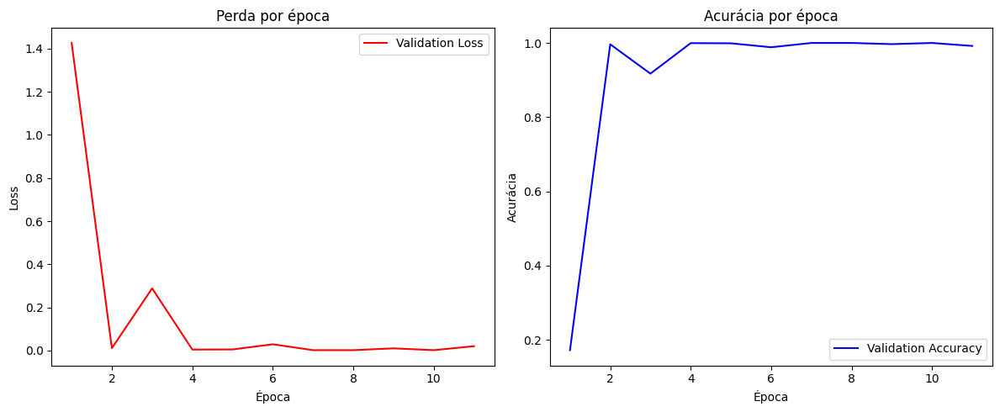

In [10]:
# Após o treinamento, chamar essa função:
plot_training_results()

In [11]:
import glob

# 🔹 Listar todos os arquivos de checkpoint salvos
checkpoints = glob.glob("meus_modelos/*.ckpt")
print("Modelos salvos:", checkpoints)

Modelos salvos: ['meus_modelos/melhor_modelo.ckpt', 'meus_modelos/melhor_modelo-v1.ckpt', 'meus_modelos/melhor_modelo-v4.ckpt', 'meus_modelos/melhor_modelo-v3.ckpt', 'meus_modelos/melhor_modelo-v2.ckpt']


In [12]:
import glob
import shutil
import os
from IPython.display import FileLink, display

# 🔹 Diretório onde os checkpoints estão
checkpoint_dir = "meus_modelos"
zip_filename = "checkpoints_salvos.zip"

# 🔹 Lista todos os arquivos .ckpt
checkpoints = glob.glob(os.path.join(checkpoint_dir, "*.ckpt"))
print("Checkpoints encontrados:", checkpoints)

# 🔹 Cria o zip
shutil.make_archive("checkpoints_salvos", 'zip', checkpoint_dir)

# 🔹 Gera link de download no notebook
display(FileLink(zip_filename))


Checkpoints encontrados: ['meus_modelos/melhor_modelo.ckpt', 'meus_modelos/melhor_modelo-v1.ckpt', 'meus_modelos/melhor_modelo-v4.ckpt', 'meus_modelos/melhor_modelo-v3.ckpt', 'meus_modelos/melhor_modelo-v2.ckpt']


/kaggle/working/checkpoints_salvos.zip

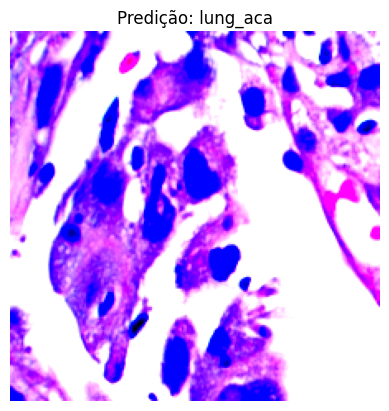

In [13]:
import torch
import PIL.Image as Image

# Carrega o melhor modelo
best_model_path = checkpoint_callback.best_model_path
model = CancerClassifier.load_from_checkpoint(best_model_path)
model.eval()

# Enviar o modelo para a GPU se disponível
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Função para prever imagens com porcentagem de confiança
def predict_image(image_path, model, transform):
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0)  # Adiciona batch dimension
    
    # Enviar a imagem para a mesma device do modelo
    image = image.to(device)
    
    with torch.no_grad():
        output = model(image)
        probabilities = torch.nn.functional.softmax(output, dim=1)  # Aplica softmax para obter probabilidades
        confidence, prediction = torch.max(probabilities, dim=1)  # Obtém a maior probabilidade e índice da classe

    class_name = dataset.classes[prediction.item()]
    confidence_percent = confidence.item() * 100  # Converte para porcentagem

    return class_name, confidence_percent  # Retorna o nome da classe e a confiança

# Testando com uma imagem nova
# 🔹 Obtém uma imagem da pasta de teste (test_loader)
test_iter = iter(test_loader)
images, labels = next(test_iter)  # Pega um batch
img_tensor = images[0]
label = labels[0].item()

# 🔹 Faz a predição usando o modelo
model.eval()
with torch.no_grad():
    outputs = model(img_tensor.unsqueeze(0).to(device))
    probs = torch.softmax(outputs, dim=1)
    confidence, predicted_class = torch.max(probs, 1)
    pred_confidence = confidence.item() * 100
    pred_class = dataset.classes[predicted_class.item()]  # usa nomes das classes

# 🔹 Exibe a imagem e a predição
plt.imshow(img_tensor.permute(1, 2, 0).cpu().numpy())
plt.title(f"Predição: {pred_class}") #({pred_confidence:.2f}%)")
plt.axis('off')
plt.show()

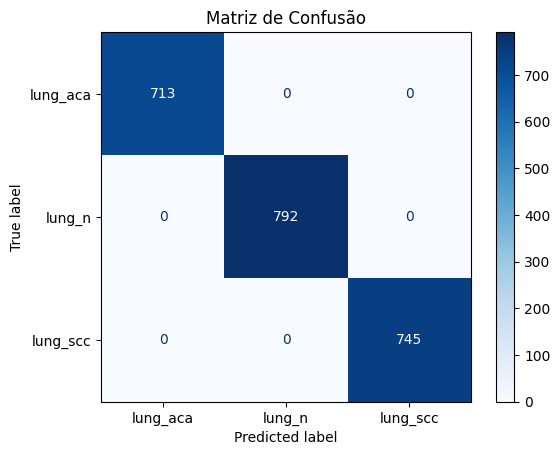


Métricas de Desempenho:
Acurácia: 1.0000
Sensibilidade (Recall - média macro): 1.0000
Precisão (Precision - média macro): 1.0000
F1-score (média macro): 1.0000

Relatório de Classificação:
              precision    recall  f1-score   support

    lung_aca       1.00      1.00      1.00       713
      lung_n       1.00      1.00      1.00       792
    lung_scc       1.00      1.00      1.00       745

    accuracy                           1.00      2250
   macro avg       1.00      1.00      1.00      2250
weighted avg       1.00      1.00      1.00      2250



In [14]:
class_names = ['lung_aca', 'lung_n', 'lung_scc']  # 🔹 Ajuste os nomes das classes
plot_confusion_matrix_and_metrics(model, val_loader, class_names)

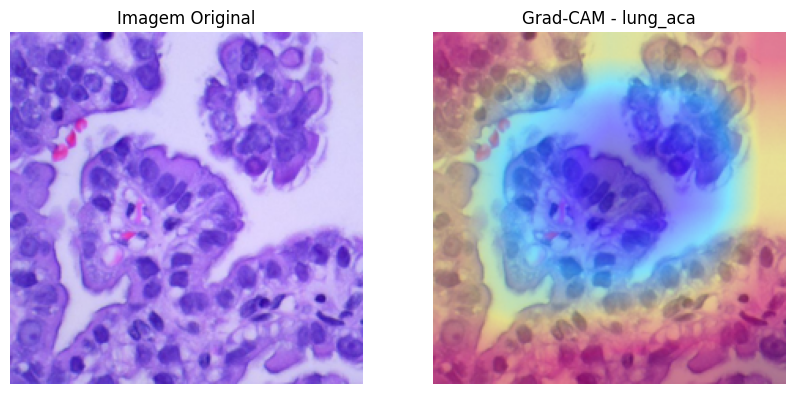

In [15]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

# Definir as transformações da ResNet
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Função Grad-CAM
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None

        # Hook para capturar os gradientes
        self.target_layer.register_forward_hook(self.forward_hook)
        self.target_layer.register_full_backward_hook(self.backward_hook)

    def forward_hook(self, module, input, output):
        self.activations = output  # Captura as ativações

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]  # Captura os gradientes

    def get_cam(self, image_tensor, class_idx=None):
        self.model.eval()
        image_tensor = image_tensor.unsqueeze(0).to(next(self.model.parameters()).device)  # Garante que está na mesma device do modelo
        
        output = self.model(image_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence, predicted_class = probabilities.max(dim=1)
        
        if class_idx is None:
            class_idx = predicted_class.item()
        
        self.model.zero_grad()
        one_hot = torch.zeros_like(output).to(output.device)
        one_hot[0][class_idx] = 1
        output.backward(gradient=one_hot)
        
        activations = self.activations.detach()
        gradients = self.gradients.detach()

        weights = gradients.mean(dim=[2, 3], keepdim=True)  # Média espacial dos gradientes
        cam = (weights * activations).sum(dim=1).squeeze(0)
        
        cam = torch.clamp(cam, min=0).cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min())
        return cam, predicted_class.item(), confidence.item()

# Função para exibir a imagem com Grad-CAM
def show_gradcam(image_path, model, target_layer, class_labels):
    image = Image.open(image_path).convert("RGB")
    image_tensor = data_transforms(image)
    
    gradcam = GradCAM(model, target_layer)
    cam, predicted_class, confidence = gradcam.get_cam(image_tensor)
    
    cam = cv2.resize(cam, (224, 224))
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    
    img_np = np.array(image.resize((224, 224)))
    
    superimposed_img = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.title("Imagem Original")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title(f"Grad-CAM - {class_labels[predicted_class]}") #({confidence * 100:.2f}%)")
    plt.axis("off")
    
    plt.show()

# Carregar o melhor modelo treinado
best_model_path = checkpoint_callback.best_model_path
model = CancerClassifier.load_from_checkpoint(best_model_path)
model.eval()

# Enviar modelo para GPU se disponível
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Usar a última camada convolucional da ResNet18
target_layer = model.model.layer4[1]  # Corrigido para pegar o bloco correto

# Definir os rótulos das classes
class_names = ['lung_aca', 'lung_n', 'lung_scc']

# Testar com uma imagem
image_path = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/lung_aca/lungaca10.jpeg"
show_gradcam(image_path, model, target_layer, class_names)

In [16]:
def show_gradcam_batch(model, target_layer, dataloader, class_labels, num_images=5):
    gradcam = GradCAM(model, target_layer)
    model.eval()

    shown = 0
    for images, labels in dataloader:
        for i in range(images.size(0)):
            image_tensor = images[i].to(device)
            label = labels[i].item()

            # ❌ NÃO use `torch.no_grad()` aqui – precisamos dos gradientes!
            cam, predicted_class, confidence = gradcam.get_cam(image_tensor)

            # Reverter normalização para exibir imagem original
            inv_transform = transforms.Normalize(
                mean=[-m/s for m, s in zip([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])],
                std=[1/s for s in [0.229, 0.224, 0.225]]
            )
            img = inv_transform(image_tensor.cpu()).permute(1, 2, 0).numpy()
            img = np.clip(img * 255, 0, 255).astype(np.uint8)

            # Grad-CAM heatmap
            cam_resized = cv2.resize(cam, (224, 224))
            cam_uint8 = np.uint8(255 * cam_resized)
            heatmap = cv2.applyColorMap(cam_uint8, cv2.COLORMAP_JET)
            superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

            # Mostrar resultado
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.title(f"Imagem Original\nLabel real: {class_labels[label]}")
            plt.axis("off")

            plt.subplot(1, 2, 2)
            plt.imshow(superimposed_img)
            plt.title(f"Grad-CAM - Pred: {class_labels[predicted_class]}") #({confidence * 100:.2f}%)")
            plt.axis("off")

            plt.show()

            shown += 1
            if shown >= num_images:
                return

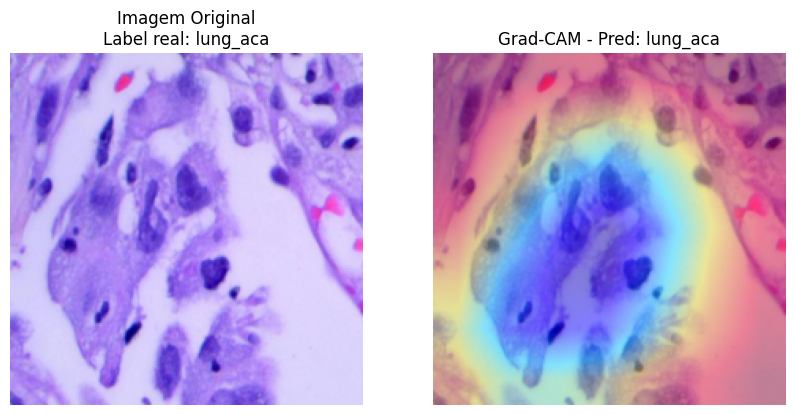

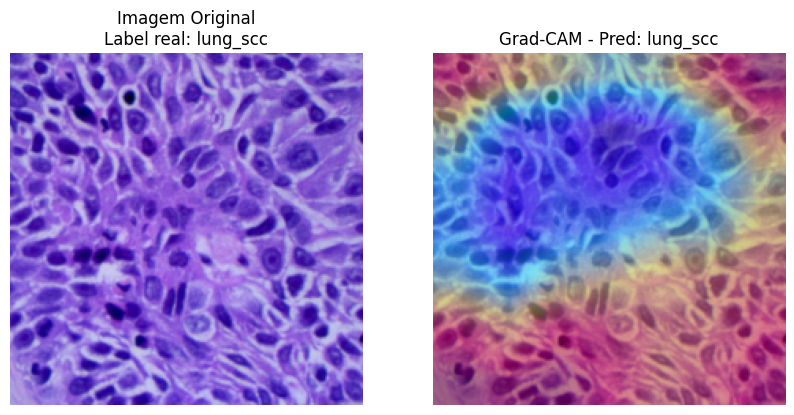

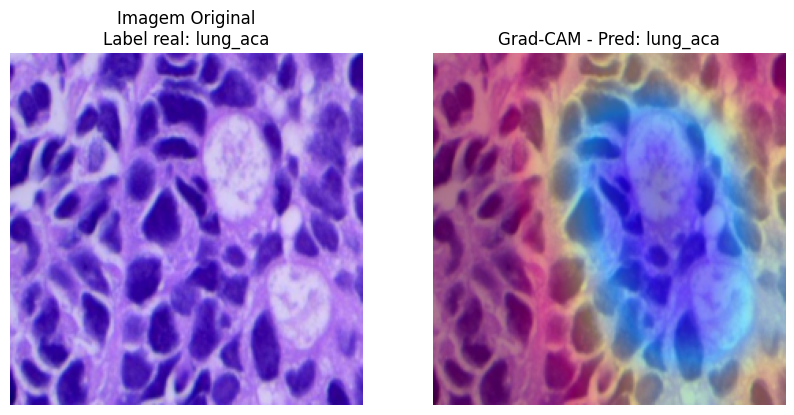

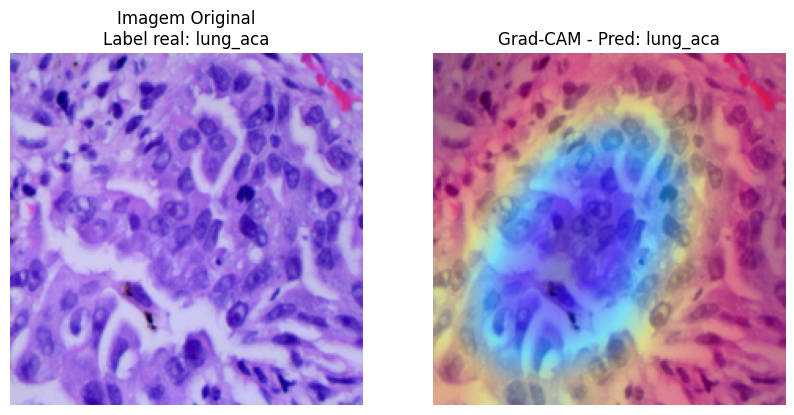

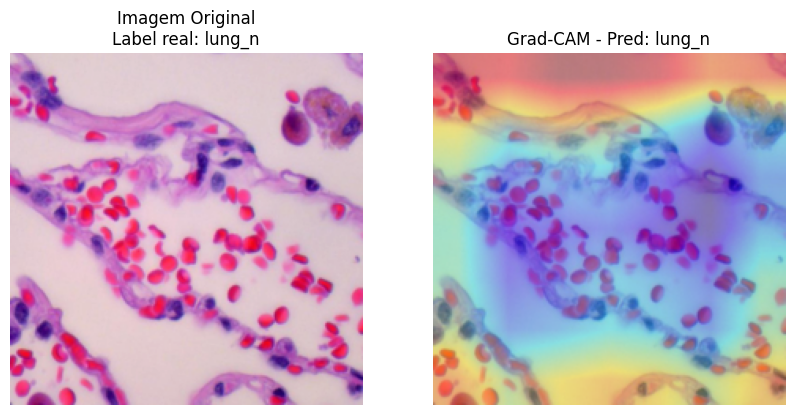

In [17]:
show_gradcam_batch(model, target_layer, test_loader, class_names, num_images=5)

In [18]:
class_labels = ['lung_aca', 'lung_n', 'lung_scc']

In [19]:
def show_gradcam_batch(model, target_layer, dataloader, class_labels, num_images=5):
    gradcam = GradCAM(model, target_layer)
    model.eval()

    shown = 0
    for images, labels in dataloader:
        for i in range(images.size(0)):
            image_tensor = images[i].to(device)
            label = labels[i].item()

            cam, predicted_class, confidence = gradcam.get_cam(image_tensor)

            # Reverter normalização para exibir imagem original
            inv_transform = transforms.Normalize(
                mean=[-m/s for m, s in zip([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])],
                std=[1/s for s in [0.229, 0.224, 0.225]]
            )
            img = inv_transform(image_tensor.cpu()).permute(1, 2, 0).numpy()
            img = np.clip(img * 255, 0, 255).astype(np.uint8)

            # Processar heatmap
            cam_resized = cv2.resize(cam, (224, 224))
            cam_uint8 = np.uint8(255 * cam_resized)
            heatmap = cv2.applyColorMap(cam_uint8, cv2.COLORMAP_JET)
            superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

            # Encontrar região de maior ativação e desenhar retângulo
            _, thresh = cv2.threshold(cam_uint8, 200, 255, cv2.THRESH_BINARY)
            contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if contours:
                max_contour = max(contours, key=cv2.contourArea)
                x, y, w, h = cv2.boundingRect(max_contour)
                cv2.rectangle(superimposed_img, (x, y), (x + w, y + h), (255, 0, 0), 3)

            # Mostrar resultado
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.title(f"Imagem Original\nLabel real: {class_labels[label]}")
            plt.axis("off")

            plt.subplot(1, 2, 2)
            plt.imshow(superimposed_img)
            plt.title(f"Grad-CAM - Pred: {class_labels[predicted_class]}") #({confidence * 100:.2f}%)")
            plt.axis("off")

            plt.show()

            shown += 1
            if shown >= num_images:
                return


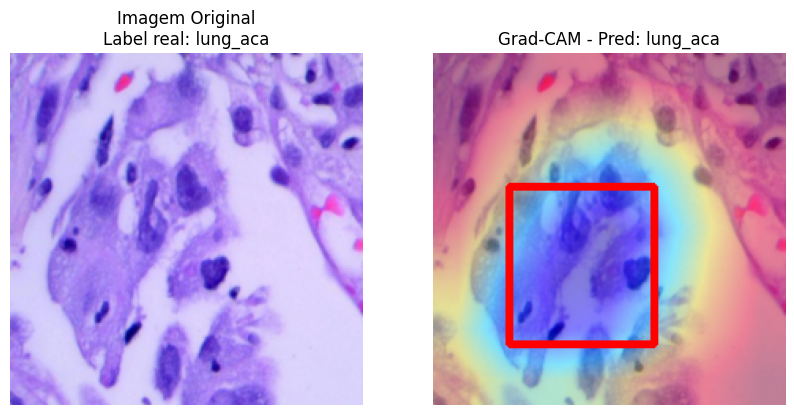

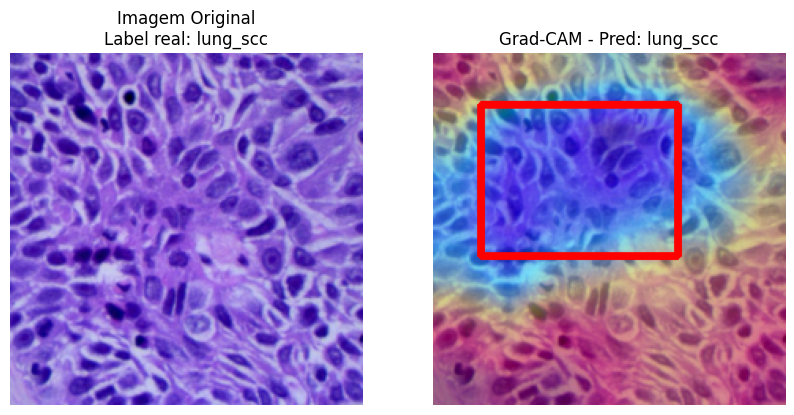

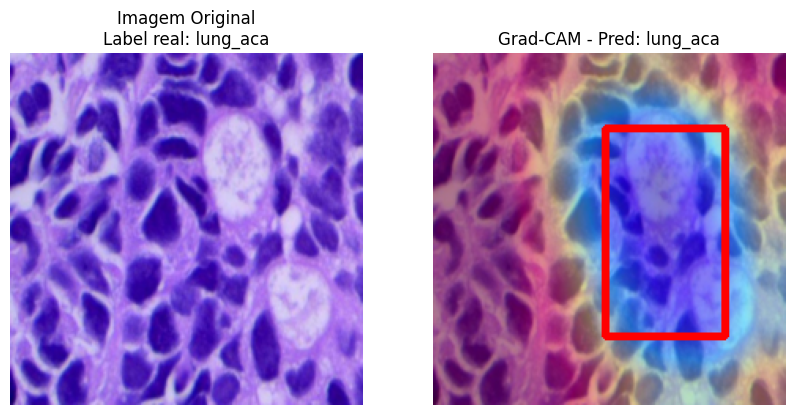

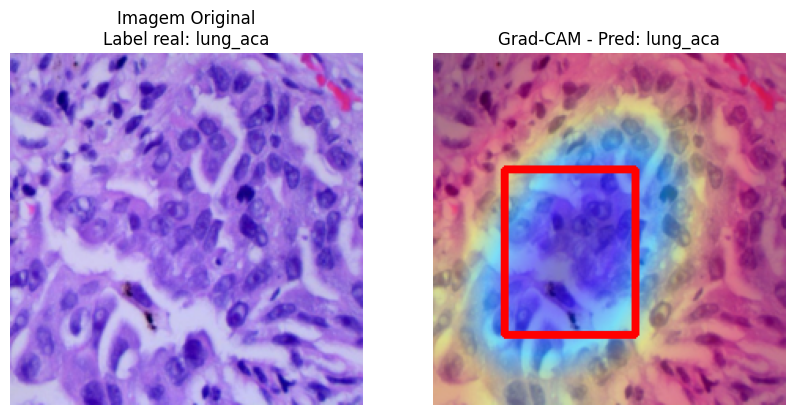

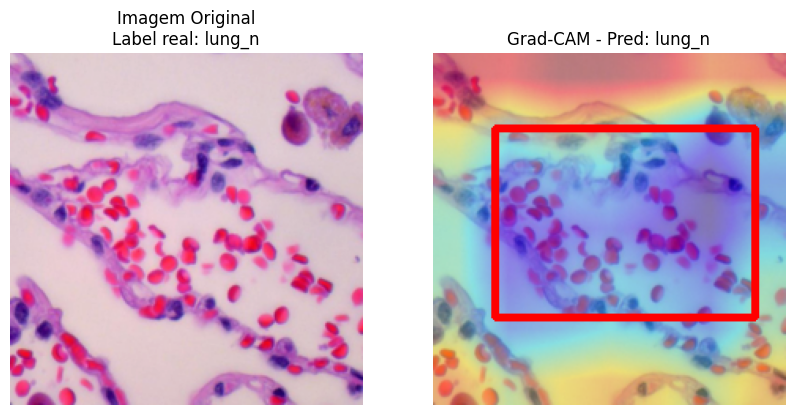

In [20]:
show_gradcam_batch(model, target_layer, test_loader, class_labels, num_images=5)

In [21]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch

def plot_confusion_matrix(model, dataloader, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    device = next(model.parameters()).device

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    plt.figure(figsize=(8, 6))
    disp.plot(cmap='Blues', values_format='d')
    plt.title("Matriz de Confusão - Teste")
    plt.show()

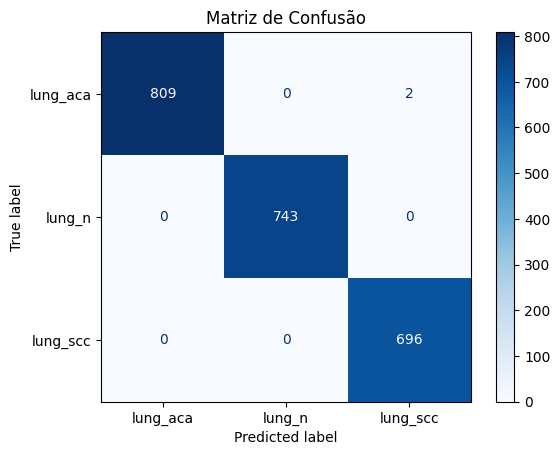


Métricas de Desempenho:
Acurácia: 0.9991
Sensibilidade (Recall - média macro): 0.9992
Precisão (Precision - média macro): 0.9990
F1-score (média macro): 0.9991

Relatório de Classificação:
              precision    recall  f1-score   support

    lung_aca       1.00      1.00      1.00       811
      lung_n       1.00      1.00      1.00       743
    lung_scc       1.00      1.00      1.00       696

    accuracy                           1.00      2250
   macro avg       1.00      1.00      1.00      2250
weighted avg       1.00      1.00      1.00      2250



In [22]:
class_names = ['lung_aca', 'lung_n', 'lung_scc']
plot_confusion_matrix_and_metrics(model, test_loader, class_names)

# **Função para visualizar os mapas de ativação**

In [23]:
import matplotlib.pyplot as plt
import torch
import torchvision

def plot_feature_maps(model, dataloader):
    model.eval()
    device = next(model.parameters()).device

    # Pegar uma imagem do test_loader
    images, labels = next(iter(dataloader))
    image = images[0].unsqueeze(0).to(device)

    # Camadas convolucionais da ResNet18
    layers = [
        model.model.conv1,
        model.model.bn1,
        model.model.relu,
        model.model.maxpool,
        model.model.layer1,
        model.model.layer2,
        model.model.layer3,
        model.model.layer4,
    ]

    x = image
    for i, layer in enumerate(layers):
        x = layer(x)
        fmap = x.squeeze(0).detach().cpu()  # Remover batch e mover para CPU

        # Plotar algumas feature maps (ex: primeiros 6)
        num_features = min(6, fmap.shape[0])
        fig, axs = plt.subplots(1, num_features, figsize=(15, 5))
        for j in range(num_features):
            axs[j].imshow(fmap[j], cmap='viridis')
            axs[j].axis('off')
        plt.suptitle(f'Feature maps após layer {i + 1} - {layer._get_name()}')
        plt.show()


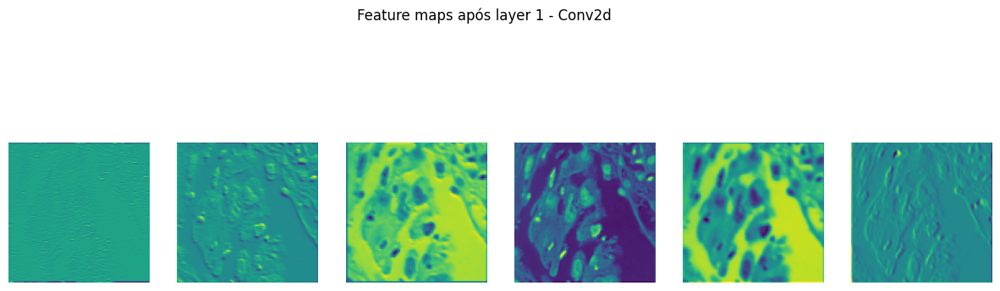

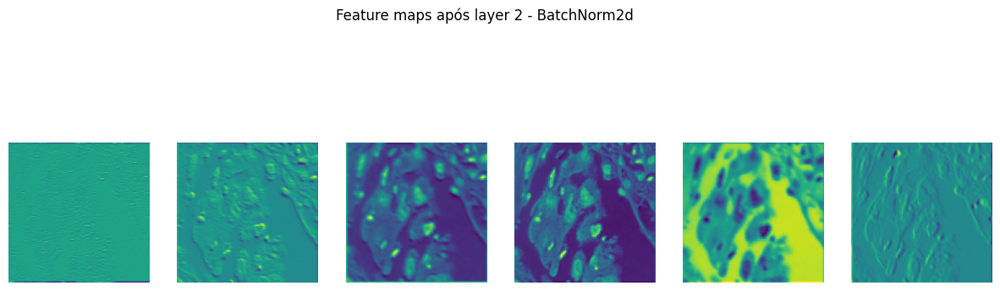

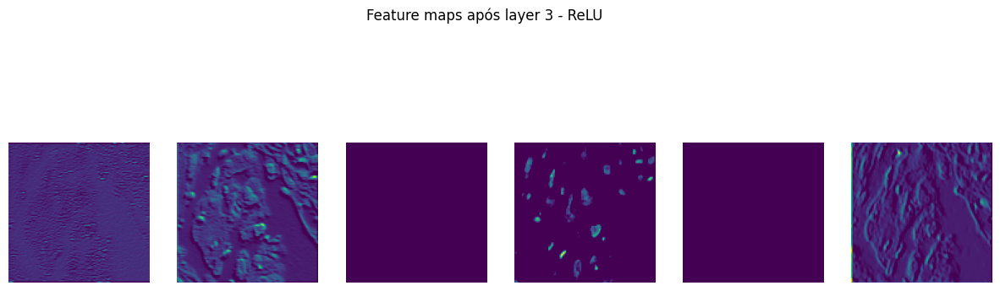

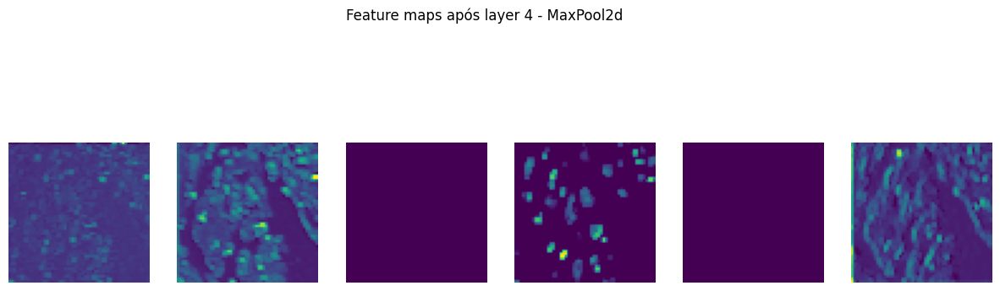

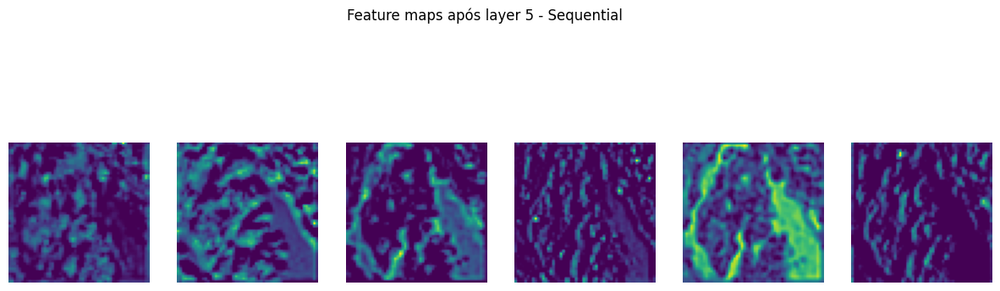

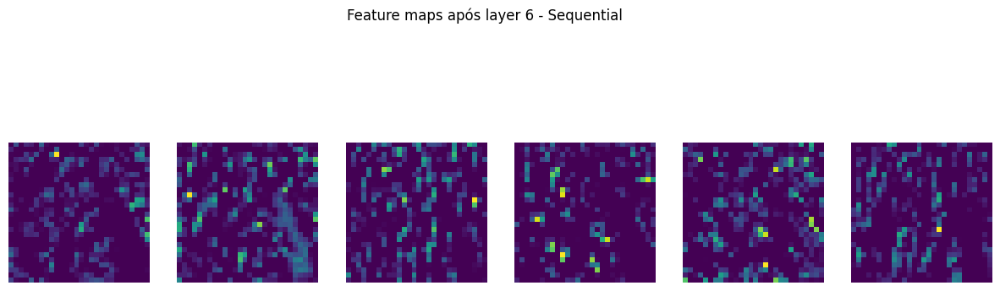

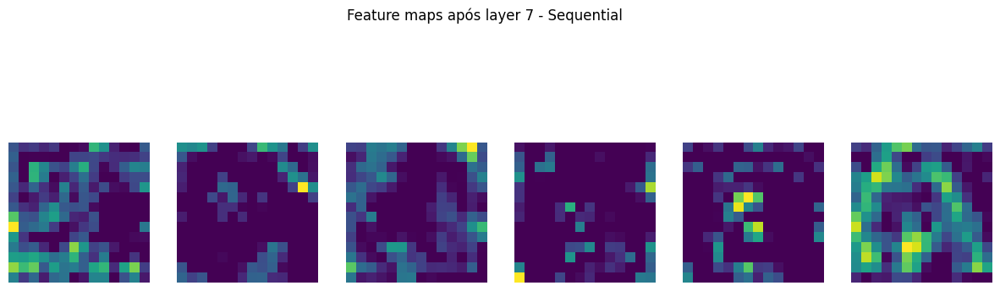

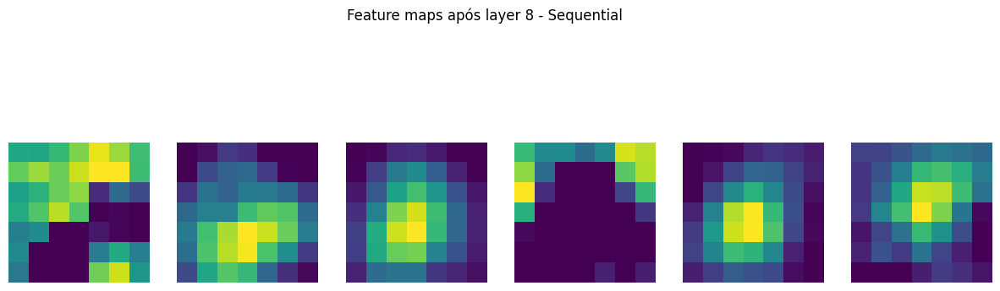

In [24]:
plot_feature_maps(model, test_loader)

# **Visualizar as ativações das camadas convolucionais**

In [25]:
def visualize_feature_maps(model, image_tensor, layer):
    activation = {}

    def hook_fn(module, input, output):
        activation['feature_map'] = output.detach().cpu()

    hook = layer.register_forward_hook(hook_fn)

    # Rodar a imagem pelo modelo
    model.eval()
    with torch.no_grad():
        _ = model(image_tensor.unsqueeze(0).to(next(model.parameters()).device))

    # Remover o hook
    hook.remove()

    # Visualizar os mapas
    feature_maps = activation['feature_map'].squeeze(0)  # Remover batch dim

    num_features = feature_maps.shape[0]
    cols = 8
    rows = num_features // cols if num_features % cols == 0 else (num_features // cols) + 1

    plt.figure(figsize=(20, 10))
    for i in range(num_features):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(feature_maps[i], cmap='viridis')
        plt.axis('off')
        plt.title(f"F{i}")
    plt.tight_layout()
    plt.show()

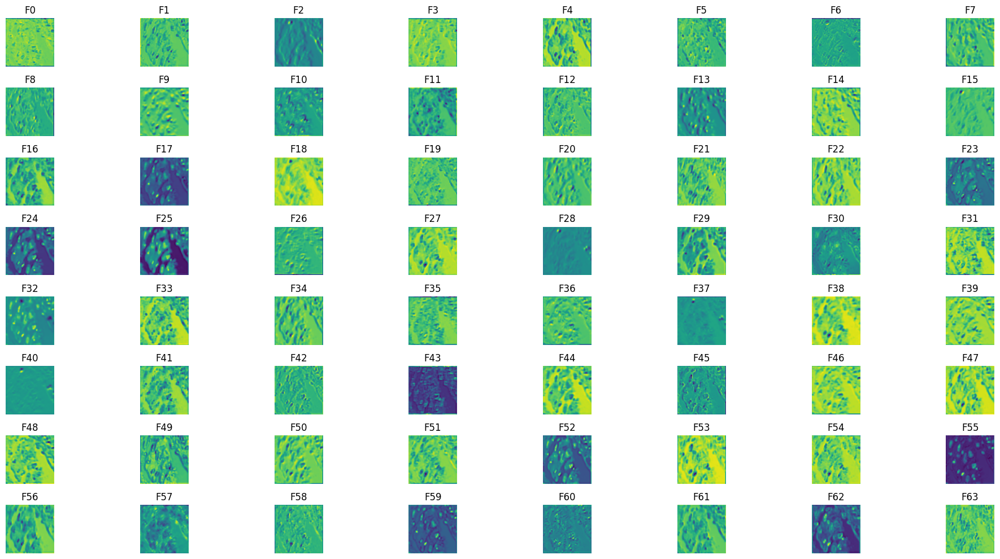

In [26]:
# Pegar uma imagem do test_loader
image_batch, label_batch = next(iter(test_loader))
image = image_batch[0].to(device)

# Pegar uma camada para visualizar (por exemplo, a primeira da ResNet)
layer_to_visualize = model.model.layer1[0].conv1

# Chamar função
visualize_feature_maps(model, image, layer_to_visualize)

# **Visualizar os feature maps da última camada convolucional antes do avgpool + fc**

In [27]:
# Mostrar apenas os 16 primeiros feature maps
def plot_selected_feature_maps(model, layer, dataloader, device):
    model.eval()

    # Obter uma imagem do test_loader
    images, labels = next(iter(dataloader))
    image = images[0].unsqueeze(0).to(device)

    # Hook para capturar as ativações
    activations = []

    def hook_fn(module, input, output):
        activations.append(output)

    handle = layer.register_forward_hook(hook_fn)

    # Forward pass
    with torch.no_grad():
        _ = model(image)

    handle.remove()

    # Obter os feature maps
    feature_maps = activations[0].squeeze(0).cpu().numpy()
    num_features = feature_maps.shape[0]

    # Plotar os 16 primeiros feature maps
    plt.figure(figsize=(12, 12))
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        plt.imshow(feature_maps[i], cmap='inferno')
        plt.title(f"Feature {i}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# **16 primeiros feature maps da camada que detecta o câncer**

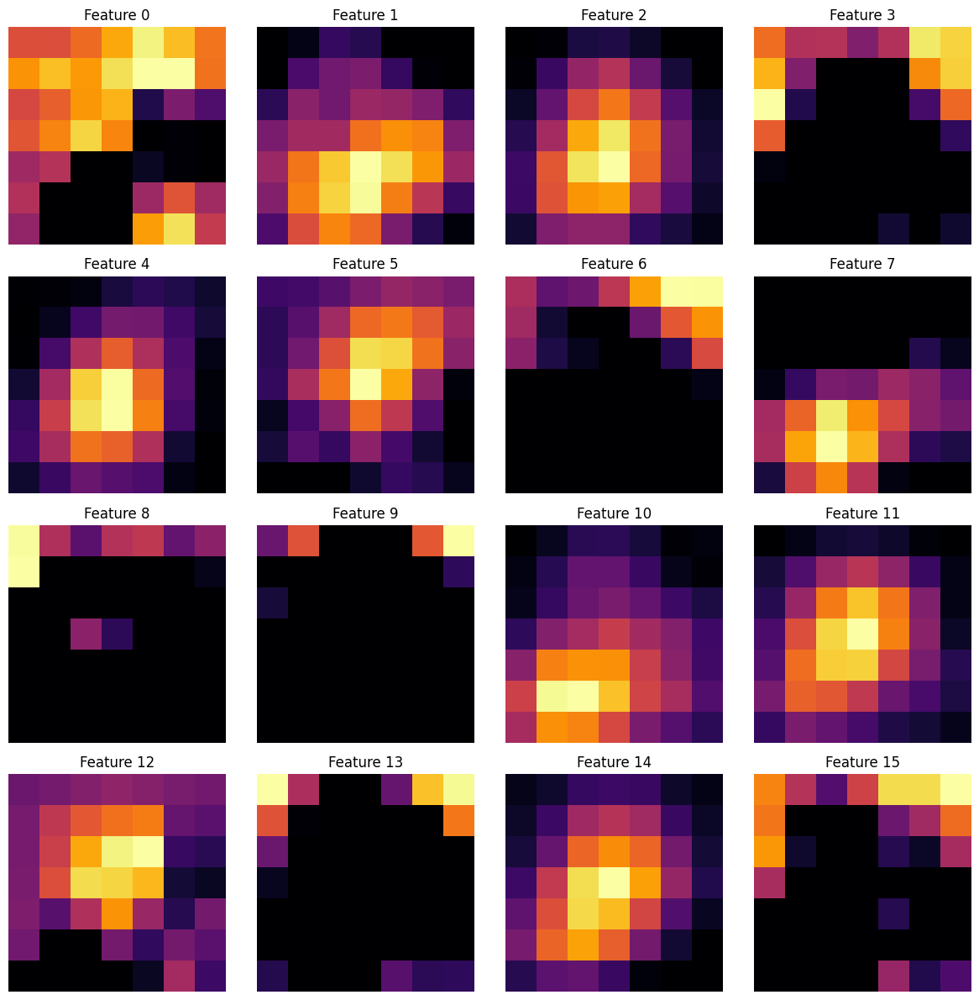

In [28]:
plot_selected_feature_maps(model, model.model.layer4[1], test_loader, device)

In [29]:
# Mostrar os 16 feature maps mais ativados
def plot_top_activated_feature_maps(model, layer, dataloader, device, top_k=16):
    model.eval()

    # Obter uma imagem do test_loader
    images, labels = next(iter(dataloader))
    image = images[0].unsqueeze(0).to(device)

    # Hook para capturar as ativações
    activations = []

    def hook_fn(module, input, output):
        activations.append(output)

    handle = layer.register_forward_hook(hook_fn)

    # Forward pass
    with torch.no_grad():
        _ = model(image)

    handle.remove()

    # Obter os feature maps
    feature_maps = activations[0].squeeze(0).cpu().numpy()
    mean_activations = feature_maps.mean(axis=(1, 2))  # Média por canal

    # Selecionar os índices dos top_k feature maps
    top_indices = mean_activations.argsort()[-top_k:][::-1]  # Do mais ativo ao menos ativo

    # Plotar os top_k feature maps
    plt.figure(figsize=(12, 12))
    for i, idx in enumerate(top_indices):
        plt.subplot(4, 4, i + 1)
        plt.imshow(feature_maps[idx], cmap='inferno')
        plt.title(f"Feature {idx} (mean={mean_activations[idx]:.2f})")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()


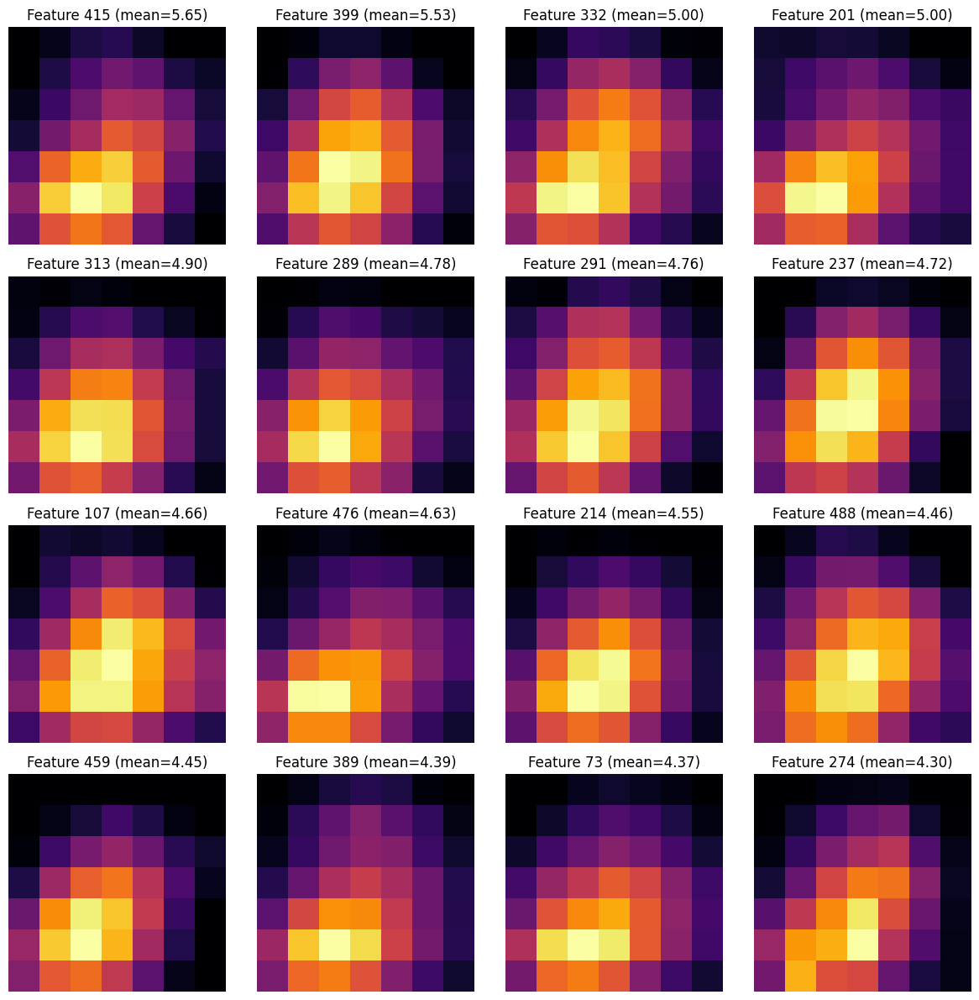

In [30]:
plot_top_activated_feature_maps(model, model.model.layer4[1], test_loader, device)

In [31]:
pip install torchcam

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [32]:
import torchcam
print(torchcam.__version__)

0.4.0


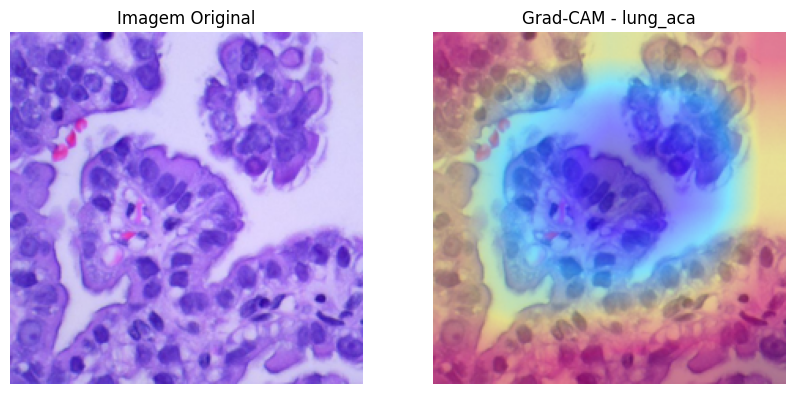

In [37]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

# Definir as transformações da ResNet
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Função Grad-CAM
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None

        # Hook para capturar os gradientes
        self.target_layer.register_forward_hook(self.forward_hook)
        self.target_layer.register_full_backward_hook(self.backward_hook)

    def forward_hook(self, module, input, output):
        self.activations = output  # Captura as ativações

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]  # Captura os gradientes

    def get_cam(self, image_tensor, class_idx=None):
        self.model.eval()
        image_tensor = image_tensor.unsqueeze(0).to(next(self.model.parameters()).device)  # Garante que está na mesma device do modelo
        
        output = self.model(image_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence, predicted_class = probabilities.max(dim=1)
        
        if class_idx is None:
            class_idx = predicted_class.item()
        
        self.model.zero_grad()
        one_hot = torch.zeros_like(output).to(output.device)
        one_hot[0][class_idx] = 1
        output.backward(gradient=one_hot)
        
        activations = self.activations.detach()
        gradients = self.gradients.detach()

        weights = gradients.mean(dim=[2, 3], keepdim=True)  # Média espacial dos gradientes
        cam = (weights * activations).sum(dim=1).squeeze(0)
        
        cam = torch.clamp(cam, min=0).cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min())
        return cam, predicted_class.item(), confidence.item()

# Função para exibir a imagem com Grad-CAM
def show_gradcam(image_path, model, target_layer, class_labels):
    image = Image.open(image_path).convert("RGB")
    image_tensor = data_transforms(image)
    
    gradcam = GradCAM(model, target_layer)
    cam, predicted_class, confidence = gradcam.get_cam(image_tensor)
    
    cam = cv2.resize(cam, (224, 224))
    cam = np.uint8(255 * cam)
    heatmap = cv2.applyColorMap(cam, cv2.COLORMAP_JET)
    
    img_np = np.array(image.resize((224, 224)))
    
    superimposed_img = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.title("Imagem Original")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title(f"Grad-CAM - {class_labels[predicted_class]}") #({confidence * 100:.2f}%)")
    plt.axis("off")
    
    plt.show()

# Carregar o melhor modelo treinado
best_model_path = checkpoint_callback.best_model_path
model = CancerClassifier.load_from_checkpoint(best_model_path)
model.eval()

# Enviar modelo para GPU se disponível
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Usar a última camada convolucional da ResNet18
target_layer = model.model.layer4[1]  # Corrigido para pegar o bloco correto

# Definir os rótulos das classes
class_names = ['lung_aca', 'lung_n', 'lung_scc']

# Testar com uma imagem
image_path = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/lung_aca/lungaca10.jpeg"
show_gradcam(image_path, model, target_layer, class_names)

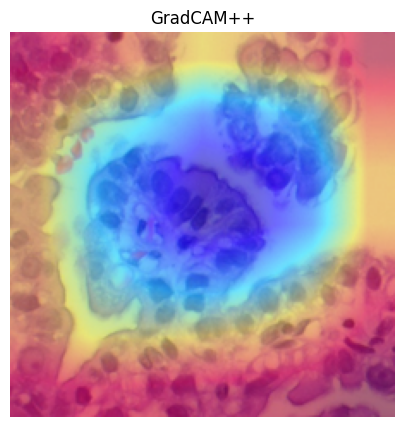

In [36]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
from torchcam.methods import GradCAMpp


# ======= TRANSFORM E DEVICE =======
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ======= FUNÇÃO: GERAÇÃO DE CAM =======
def generate_gradcampp(model, target_layer, input_tensor, pred_class):
    cam_method = GradCAMpp(model, target_layer)

    with torch.set_grad_enabled(True):
        input_tensor.requires_grad_()
        output = model(input_tensor)
        cam_map = cam_method(class_idx=[pred_class], scores=output)[0].detach().cpu().numpy()
        cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)
        return cam_map


# ======= FUNÇÃO: SOBREPOSIÇÃO COM A IMAGEM =======
def overlay_cam_on_image(image, cam_map, title="GradCAM++"):
    cam_map = np.squeeze(cam_map)  # Remove dimensões extras, caso existam
    cam_map = np.uint8(255 * cam_map)
    if cam_map.ndim != 2:
        raise ValueError(f"Esperado mapa 2D para o CAM, mas recebeu shape {cam_map.shape}")
    
    cam_map = cv2.resize(cam_map, (224, 224))
    heatmap = cv2.applyColorMap(cam_map, cv2.COLORMAP_JET)

    original_img = np.array(image.resize((224, 224)))
    if original_img.ndim == 2 or original_img.shape[2] == 1:
        original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2BGR)

    superimposed = cv2.addWeighted(original_img, 0.5, heatmap, 0.5, 0)
    

    plt.figure(figsize=(6, 5))
    plt.imshow(superimposed)
    plt.title(title)
    plt.axis('off')
    plt.show()



# ======= EXECUÇÃO =======
# Carregar imagem
image_path = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/lung_aca/lungaca10.jpeg"
image = Image.open(image_path).convert("RGB")
input_tensor = transform(image).unsqueeze(0).to(device)

# Carregar modelo treinado
best_model_path = checkpoint_callback.best_model_path
model = CancerClassifier.load_from_checkpoint(best_model_path).eval().to(device)
target_layer = model.model.layer4[-1]

# Obter classe prevista
with torch.no_grad():
    output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()

# Gerar e visualizar GradCAM++
gradcampp_map = generate_gradcampp(model, target_layer, input_tensor, pred_class)
overlay_cam_on_image(image, gradcampp_map, "GradCAM++")


In [38]:
from torchcam.methods import ScoreCAM
import matplotlib.pyplot as plt
import numpy as np
import cv2
from torchvision import transforms
from PIL import Image
import torch

def scorecam_visualization(model, target_layer, image_path):
    # Transforms padrão para ResNet
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    # Carregar imagem e preparar input
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    input_tensor = input_tensor.to(device)
    model = model.to(device).eval()

    # Inicializar ScoreCAM
    cam_extractor = ScoreCAM(model, target_layer)

    # Forward e obtenção da classe prevista
    with torch.no_grad():
        output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()

    # Gerar CAM com gradientes
    with torch.set_grad_enabled(True):
        input_tensor.requires_grad_()
        output = model(input_tensor)
        cam_map = cam_extractor(class_idx=[pred_class], scores=output)[0].cpu().numpy()

    # Normalizar e converter para uint8
    cam_map = np.squeeze(cam_map)
    cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)
    cam_map = np.uint8(255 * cam_map)
    cam_map = cv2.resize(cam_map, (224, 224))
    heatmap = cv2.applyColorMap(cam_map, cv2.COLORMAP_JET)

    # Imagem original
    original_img = np.array(image.resize((224, 224)))
    if original_img.ndim == 2 or original_img.shape[2] == 1:
        original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2BGR)

    # Sobrepor heatmap
    superimposed = cv2.addWeighted(original_img, 0.5, heatmap, 0.5, 0)

    # Mostrar imagem final
    plt.figure(figsize=(6, 5))
    plt.imshow(superimposed)
    plt.title("ScoreCAM")
    plt.axis('off')
    plt.show()


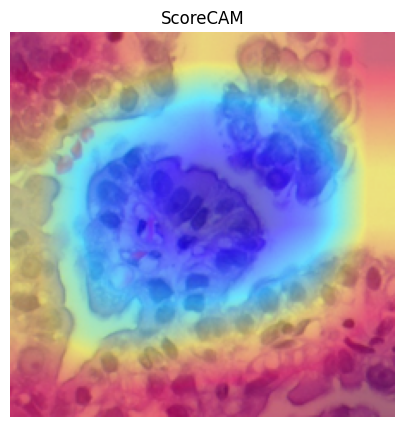

In [39]:
target_layer = model.model.layer4[-1]
image_path = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/lung_aca/lungaca10.jpeg"

scorecam_visualization(model, target_layer, image_path)

In [76]:
def layercam_visualization(model, target_layer, image_path):
    from torchcam.methods import LayerCAM
    import torch
    import numpy as np
    import cv2
    import matplotlib.pyplot as plt
    from PIL import Image
    from torchvision import transforms

    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    input_tensor = input_tensor.to(device)
    model = model.to(device).eval()

    cam_extractor = LayerCAM(model, target_layer)

    input_tensor.requires_grad_()
    with torch.set_grad_enabled(True):
        output = model(input_tensor)
        pred_class = output.argmax(dim=1).item()
        cam_map = cam_extractor(class_idx=[pred_class], scores=output)[0].cpu().numpy()

    # 🔧 Correção: garantir 2D e uint8
    cam_map = np.squeeze(cam_map)
    cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)
    cam_map = np.uint8(255 * cam_map)
    cam_map = cv2.resize(cam_map, (224, 224))
    heatmap = cv2.applyColorMap(cam_map, cv2.COLORMAP_JET)

    original_img = np.array(image.resize((224, 224)))
    if original_img.ndim == 2 or original_img.shape[2] == 1:
        original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2BGR)

    superimposed = cv2.addWeighted(original_img, 0.5, heatmap, 0.5, 0)

    plt.figure(figsize=(6, 5))
    plt.imshow(superimposed)
    plt.title("LayerCAM")
    plt.axis('off')
    plt.show()

    return cam_map 

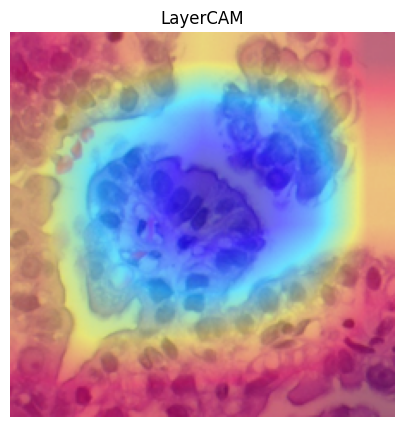

In [77]:
target_layer = model.model.layer4[-1]
image_path = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/lung_aca/lungaca10.jpeg"

cam_layercam = layercam_visualization(model, target_layer, image_path)

In [72]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

def show_cam_intersection(cams, original_image, alpha=0.5, figsize=(6,6)):
    """
    Gera e exibe a interseção (multiplicação) das máscaras CAM e sobrepõe na imagem original.

    Parâmetros:
    - cams: lista de numpy arrays (H, W), normalizados entre 0 e 1
    - original_image: PIL Image ou numpy array (H, W, 3), RGB ou BGR
    - alpha: transparência da máscara sobreposta (float entre 0 e 1)
    - figsize: tamanho da figura do matplotlib
    
    Retorna:
    - superimposed: imagem resultante (numpy array uint8)
    """
    # Empilhar e multiplicar as máscaras
    intersection = np.prod(np.stack(cams), axis=0)
    # Normalizar
    intersection = (intersection - intersection.min()) / (intersection.max() - intersection.min() + 1e-8)
    
    # Converter a máscara para colormap JET
    heatmap = (255 * intersection).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # BGR
    
    # Converter original para numpy BGR se for PIL RGB
    if isinstance(original_image, Image.Image):
        original_np = np.array(original_image.convert("RGB"))
        original_np = cv2.cvtColor(original_np, cv2.COLOR_RGB2BGR)
    else:
        original_np = original_image.copy()
    
    # Redimensionar original para o tamanho da máscara
    heatmap = cv2.resize(heatmap, (original_np.shape[1], original_np.shape[0]))
    
    # Sobrepor heatmap na imagem original
    superimposed = cv2.addWeighted(original_np, 1 - alpha, heatmap, alpha, 0)
    
    # Mostrar com matplotlib (converter para RGB)
    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(superimposed, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Interseção dos CAMs")
    plt.show()
    
    return superimposed


In [74]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
from torchcam.methods import GradCAM, GradCAMpp, ScoreCAM, LayerCAM

# Transform para ResNet
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Função auxiliar para sobrepor o heatmap
def overlay_cam_on_image(image, cam_map, title="CAM", alpha=0.5):
    cam_map = (cam_map * 255).astype(np.uint8)
    cam_map = cv2.resize(cam_map, (224, 224))
    heatmap = cv2.applyColorMap(cam_map, cv2.COLORMAP_JET)

    original_img = np.array(image.resize((224, 224)))
    superimposed = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)
    
    plt.figure(figsize=(5, 5))
    plt.imshow(superimposed)
    plt.title(title)
    plt.axis('off')
    plt.show()
    return superimposed

# GradCAM
def show_gradcam(image_path, model, target_layer, class_names=None):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)
    model.eval()

    cam_extractor = GradCAM(model, target_layer)
    output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()
    class_label = class_names[pred_class] if class_names else f"Classe {pred_class}"
    
    cam_map = cam_extractor(class_idx=[pred_class], scores=output)[0].cpu().numpy()
    cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)
    overlay_cam_on_image(image, cam_map, f"GradCAM - {class_label}")

# GradCAM++
def generate_gradcampp(model, target_layer, input_tensor, pred_class):
    cam = GradCAMpp(model, target_layer)
    model.eval()
    with torch.set_grad_enabled(True):
        output = model(input_tensor)
        cam_map = cam(class_idx=[pred_class], scores=output)[0].cpu().numpy()
        cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)
        return cam_map

# ScoreCAM
def scorecam_visualization(model, target_layer, image_path):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)
    model.eval()

    cam = ScoreCAM(model, target_layer)
    output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()

    cam_map = cam(class_idx=[pred_class], scores=output)[0].cpu().numpy()
    cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)

    overlay_cam_on_image(image, cam_map, "ScoreCAM")

# LayerCAM
def layercam_visualization(model, target_layer, image_path):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)
    model.eval()

    cam = LayerCAM(model, target_layer)
    output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()

    cam_map = cam(class_idx=[pred_class], scores=output)[0].cpu().numpy()
    cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-8)

    overlay_cam_on_image(image, cam_map, "LayerCAM")
